### Interactive Plotly

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

In [7]:
df = pd.read_csv(r"C:/Users/Imran/Interactive Plotly Project/US_honey_production_dataset.csv", index_col=0)
df

,state,colony_number,yield_per_colony,productions,stocks,average_price,value_of_prod,year
0,Alabama,9000,54,73000,73000,240.00,1166000,2010
1,Arizona,24000,77,665000,665000,152.00,2809000,2010
2,Arkansas,25000,60,360000,360000,147.00,2205000,2010
3,California,410000,67,6318000,6318000,155.00,42579000,2010
4,Colorado,34000,56,533000,533000,152.00,2894000,2010
...,...,...,...,...,...,...,...,...
474,Virginia,6000,40,79000,79000,8.23,1975000,2021
475,Washington,96000,32,1206000,1206000,2.52,7741000,2021
476,WestVirginia,6000,43,136000,136000,4.80,1238000,2021
477,Wisconsin,42000,47,750000,750000,2.81,5547000,2021


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 479 entries, 0 to 478
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   state             479 non-null    object 
 1   colony_number     479 non-null    int64  
 2   yield_per_colony  479 non-null    int64  
 3   productions       479 non-null    int64  
 4   stocks            479 non-null    int64  
 5   average_price     479 non-null    float64
 6   value_of_prod     479 non-null    int64  
 7   year              479 non-null    int64  
dtypes: float64(1), int64(6), object(1)
memory usage: 33.7+ KB


### Exploratory Data Analysis

### Year_buckets

<Axes: ylabel='Frequency'>

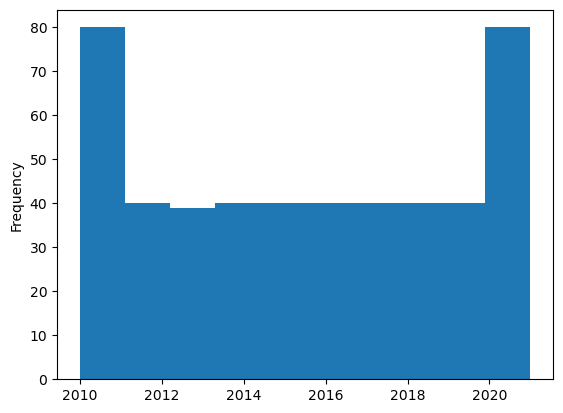

In [9]:
df['year'].plot(kind='hist')

In [10]:
df['year_bin'] = pd.cut(df['year'], bins=[2000,2013,2017,2025],
                       labels=['10-13', '14-17', '18-21'])

In [11]:
df['year_bin'].value_counts()

year_bin
14-17    160
18-21    160
10-13    159
Name: count, dtype: int64

### yield_per_colony buckets

<Axes: ylabel='Frequency'>

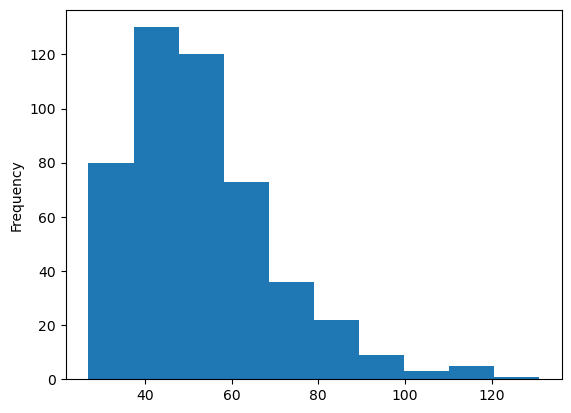

In [12]:
df['yield_per_colony'].plot(kind='hist')

In [13]:
df['yield_per_colony_bin'] = pd.cut(df['yield_per_colony'],
                                    bins=[25,60,135],
                                    labels=['low', 'high'])

In [14]:
df['yield_per_colony_bin'].value_counts()

yield_per_colony_bin
low     348
high    131
Name: count, dtype: int64

### 1D Analysis

### Plotly - Histogram

In [15]:
df.columns

Index(['state', 'colony_number', 'yield_per_colony', 'productions', 'stocks',
       'average_price', 'value_of_prod', 'year', 'year_bin',
       'yield_per_colony_bin'],
      dtype='object')

In [16]:
width = 700
height = 350
margin_dict = dict(t=50, l=25, r=25, b=50)

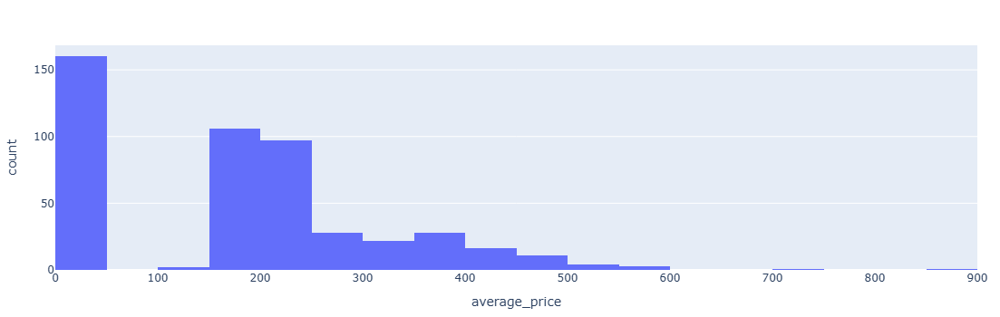

In [17]:
fig = px.histogram(df, x='average_price',
                   width=width, height=height
                   )
fig.update_layout(margin = margin_dict)
fig.show()

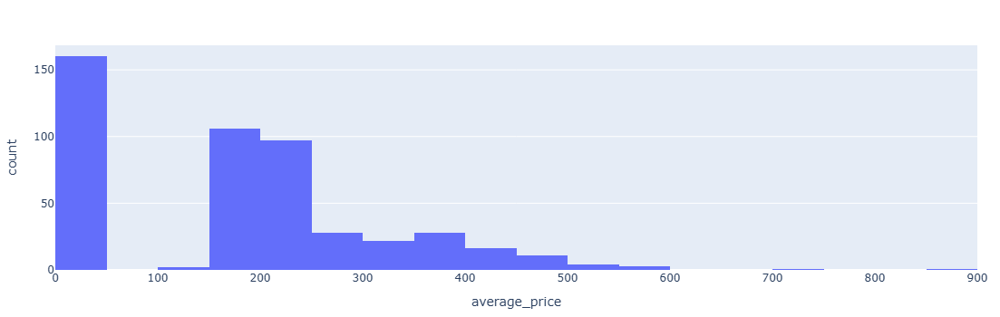

In [18]:
fig = px.histogram(df, x='average_price', nbins=40,
                   width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

In [19]:
df.isnull().sum()

state                   0
colony_number           0
yield_per_colony        0
productions             0
stocks                  0
average_price           0
value_of_prod           0
year                    0
year_bin                0
yield_per_colony_bin    0
dtype: int64

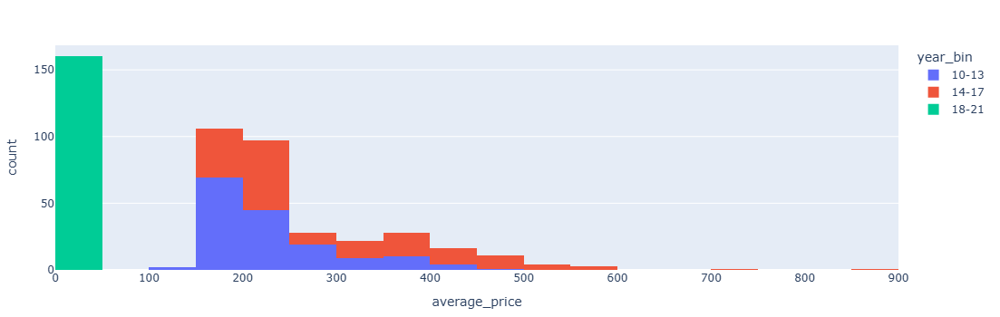

In [20]:
fig = px.histogram(df, x='average_price', nbins=30,
                   color='year_bin', width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

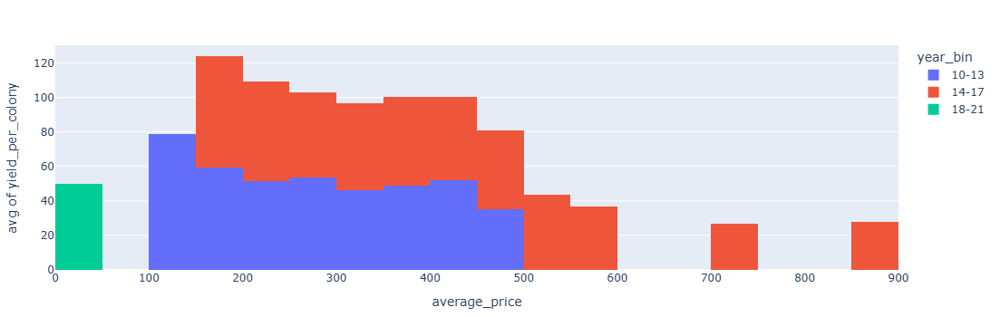

In [21]:
fig = px.histogram(df, x='average_price', nbins=30,
                   color='year_bin', y='yield_per_colony', histfunc='avg',
                   width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

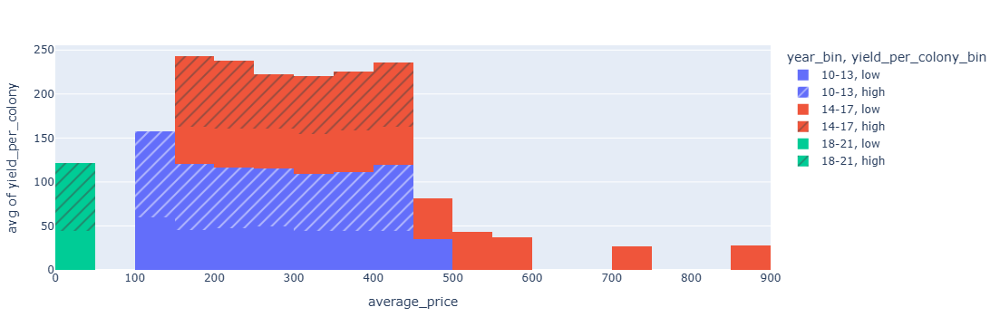

In [22]:
fig = px.histogram(df, x='average_price', nbins=30, color='year_bin',
                   y='yield_per_colony', histfunc='avg',
                   pattern_shape='yield_per_colony_bin',
                   width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

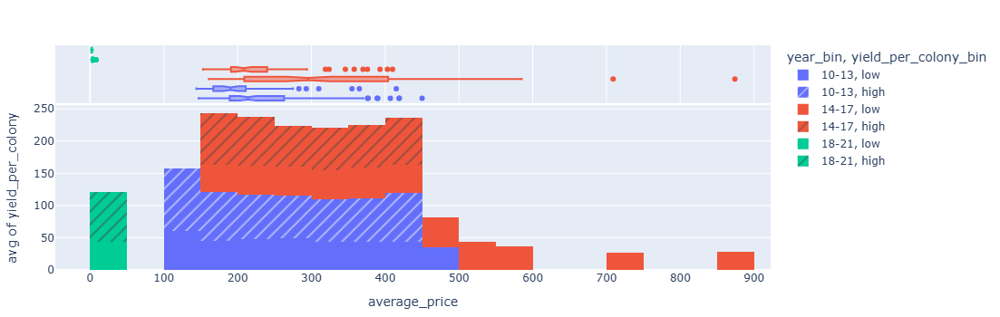

In [23]:
fig = px.histogram(df, x='average_price', nbins=30,color='year_bin',
                   y='yield_per_colony', histfunc='avg',
                   pattern_shape='yield_per_colony_bin',
                   marginal='box',
                   width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

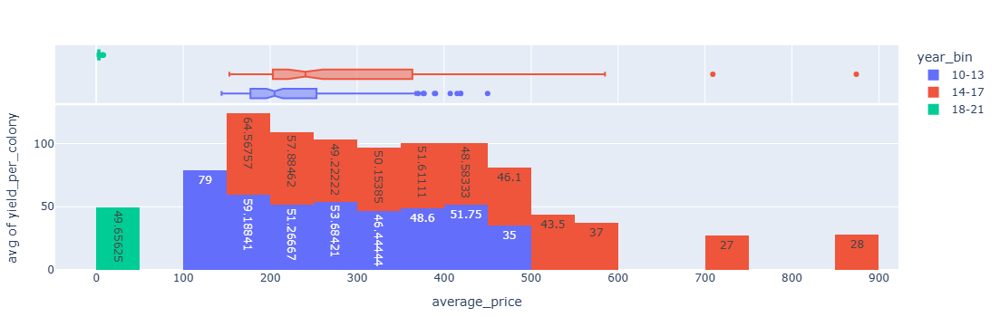

In [24]:
fig = px.histogram(df, x='average_price', nbins=30,color='year_bin',
                   y='yield_per_colony', histfunc='avg',
                   marginal='box', text_auto=True,
                   width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

### Violinplot

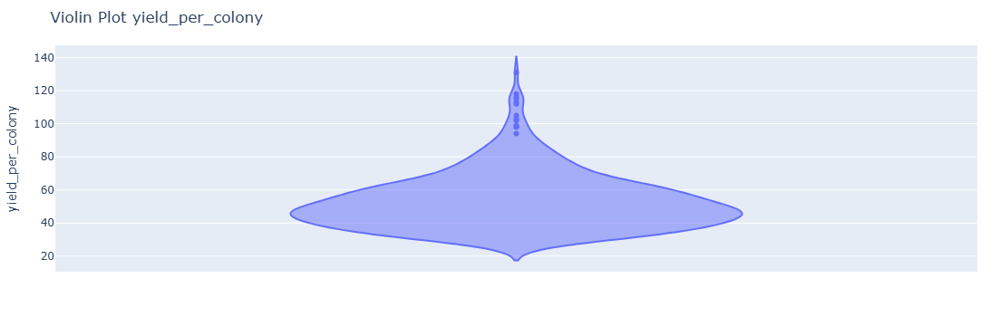

In [25]:
fig = px.violin(df, y='yield_per_colony', title='\nViolin Plot yield_per_colony',
                width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

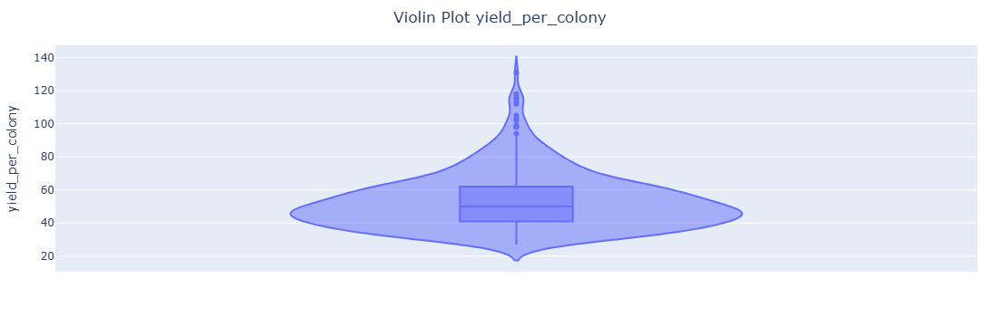

In [26]:
fig = px.violin(df, y='yield_per_colony', width=width, height=height,
                box=True)
fig.update_layout(margin=margin_dict, title='\nViolin Plot yield_per_colony',
                  title_x=.5)
fig.show()

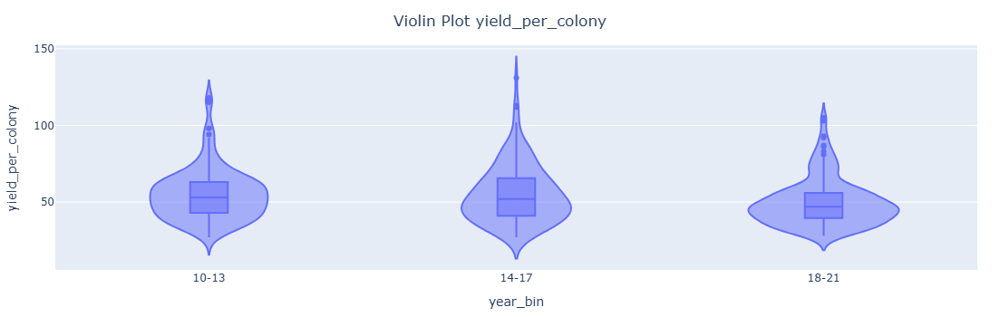

In [27]:
fig = px.violin(df, y='yield_per_colony', x='year_bin',
                width=width, height=height,
                box=True)
fig.update_layout(margin=margin_dict, title='\nViolin Plot yield_per_colony',
                  title_x=.5, title_y=.95)
fig.show()

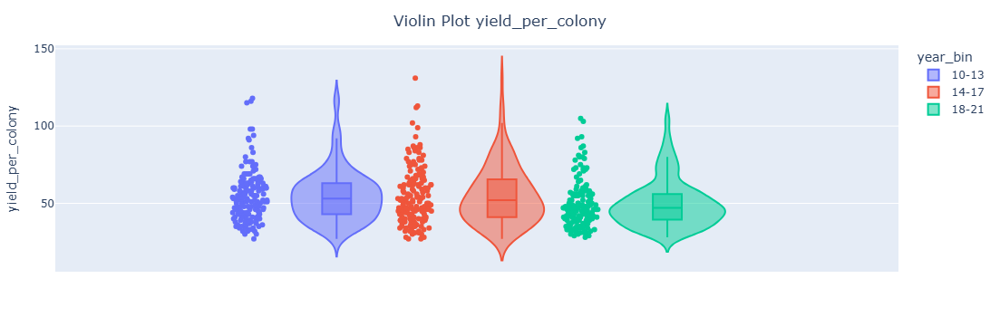

In [28]:
fig = px.violin(df, y='yield_per_colony', points='all',
                width=900, height=height, color='year_bin',
                box=True, hover_data=df.columns)
fig.update_layout(margin=margin_dict, title='\nViolin Plot yield_per_colony',
                  title_x=.5, title_y=.95)
fig.show()

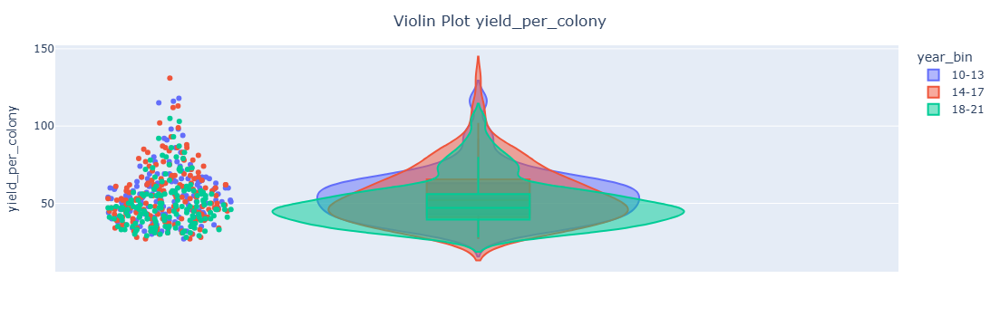

In [29]:
fig = px.violin(df,y='yield_per_colony', points='all',
                width=900, height=height, color='year_bin',
                violinmode='overlay',  hover_name='yield_per_colony',
                box=True, hover_data=df.columns)
fig.update_layout(margin=margin_dict, title='\nViolin Plot yield_per_colony',
                  title_x=.5, title_y=.95)
fig.show()

### Sunburst

In [31]:
df.columns

Index(['state', 'colony_number', 'yield_per_colony', 'productions', 'stocks',
       'average_price', 'value_of_prod', 'year', 'year_bin',
       'yield_per_colony_bin'],
      dtype='object')

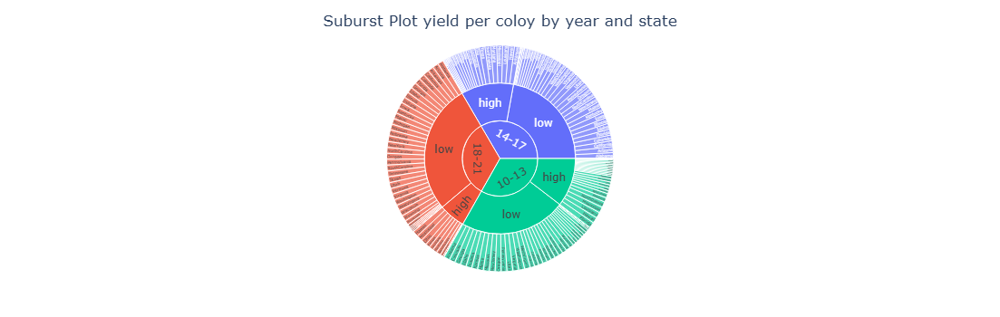

In [34]:
import warnings
# Add this at the top of your script to ignore the specific FutureWarning
warnings.filterwarnings("ignore", category=FutureWarning)

fig = px.sunburst(df, path=['year_bin','yield_per_colony_bin', 'state'],
                  width=500, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nSuburst Plot yield per coloy by year and state',
                  title_x=.5, title_y=.95)
fig.show()

### states

In [35]:
states = df['state'].value_counts().index[:5]

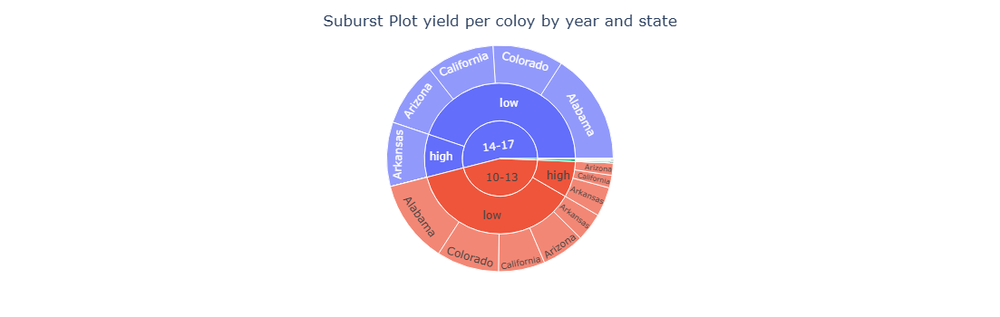

In [36]:
fig = px.sunburst(df[df['state'].isin(states)], path=['year_bin','yield_per_colony_bin', 'state'],
                  values='average_price',
                  width=500, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nSuburst Plot yield per coloy by year and state',
                  title_x=.5, title_y=.95)
fig.show()

In [37]:
df.columns

Index(['state', 'colony_number', 'yield_per_colony', 'productions', 'stocks',
       'average_price', 'value_of_prod', 'year', 'year_bin',
       'yield_per_colony_bin'],
      dtype='object')

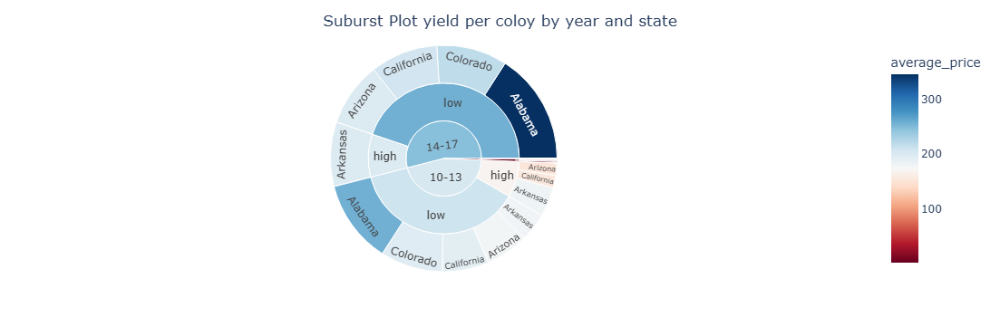

In [38]:
fig = px.sunburst(df[df['state'].isin(states)], path=['year_bin','yield_per_colony_bin', 'state'],
                  values='average_price',
                  color='average_price', color_continuous_scale='RdBu',
                  width=500, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nSuburst Plot yield per coloy by year and state',
                  title_x=.5, title_y=.95)
fig.show()

### Tree Map

In [39]:
df.columns

Index(['state', 'colony_number', 'yield_per_colony', 'productions', 'stocks',
       'average_price', 'value_of_prod', 'year', 'year_bin',
       'yield_per_colony_bin'],
      dtype='object')

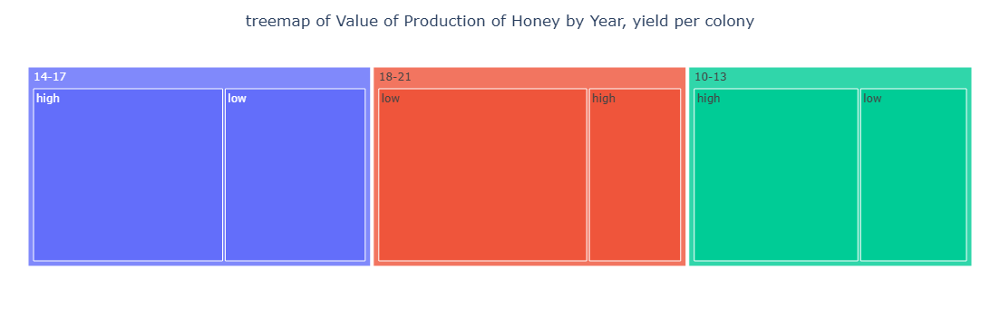

In [40]:
fig = px.treemap(df, values='value_of_prod', path=['year_bin','yield_per_colony_bin'],
                 width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\ntreemap of Value of Production of Honey by Year, yield per colony',
                  title_x=.5, title_y=.95)
fig.show()

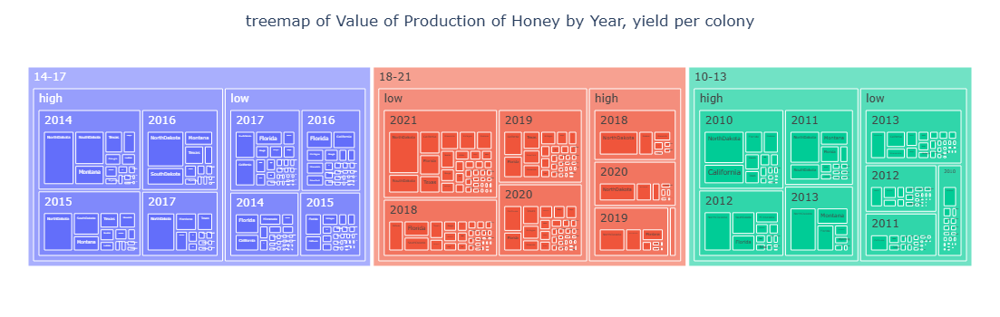

In [41]:
fig = px.treemap(df, values='value_of_prod', path=['year_bin','yield_per_colony_bin',
                                                   'year', 'state'],
                 width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\ntreemap of Value of Production of Honey by Year, yield per colony',
                  title_x=.5, title_y=.95)
fig.show()

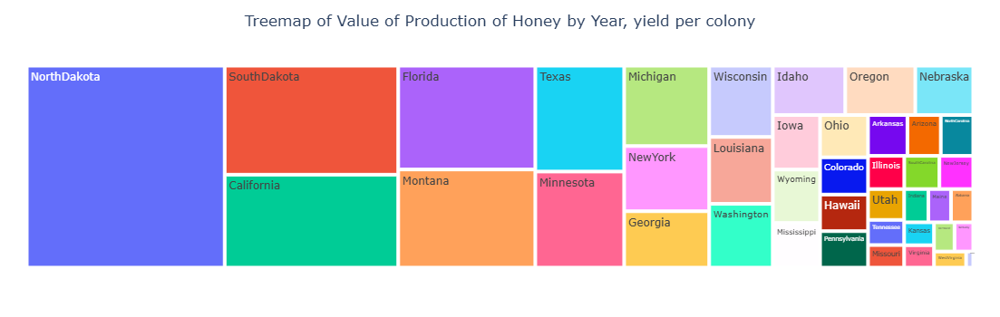

In [42]:
fig = px.treemap(df, values='value_of_prod', path=['state'],
                 width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nTreemap of Value of Production of Honey by Year, yield per colony',
                  title_x=.5, title_y=.95)
fig.show()

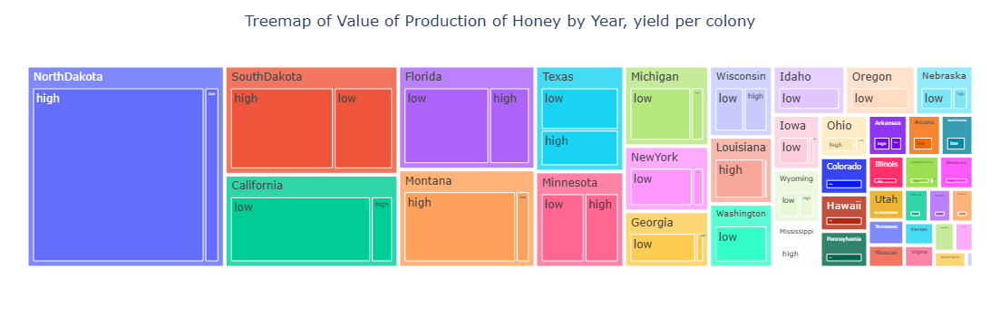

In [43]:
fig = px.treemap(df, values='value_of_prod', path=['state', 'yield_per_colony_bin'],
                 width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nTreemap of Value of Production of Honey by Year, yield per colony',
                  title_x=.5, title_y=.95)
fig.show()                  

### 2D Analysis

### Density Heatmap

In [44]:
df.columns

Index(['state', 'colony_number', 'yield_per_colony', 'productions', 'stocks',
       'average_price', 'value_of_prod', 'year', 'year_bin',
       'yield_per_colony_bin'],
      dtype='object')

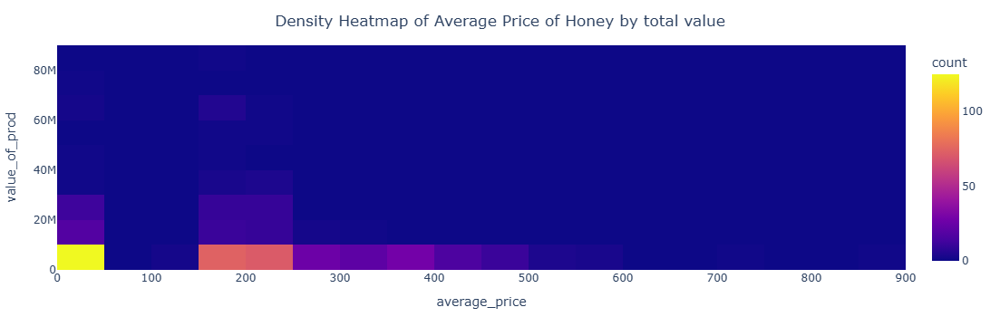

In [45]:
fig = px.density_heatmap(df, x='average_price', y='value_of_prod',
                         nbinsx=20, nbinsy=15,
                        width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nDensity Heatmap of Average Price of Honey by total value',
                  title_x=.5, title_y=.95)
fig.show()

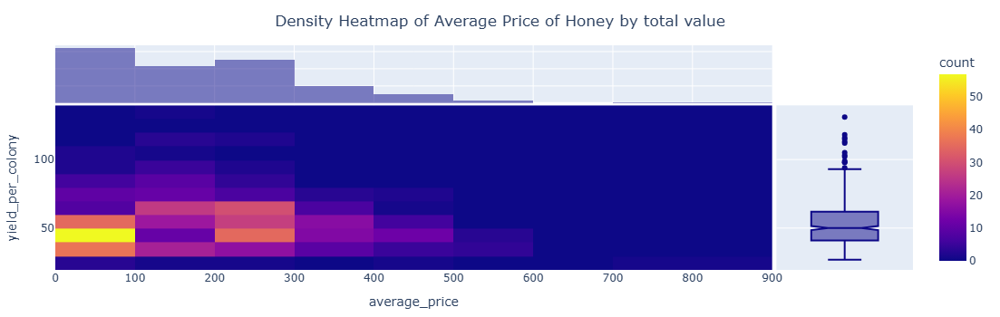

In [46]:
fig = px.density_heatmap(df, x='average_price', y='yield_per_colony',
                         marginal_x='histogram', marginal_y='box',
                         width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nDensity Heatmap of Average Price of Honey by total value',
                  title_x=.5, title_y=.95)
fig.show()

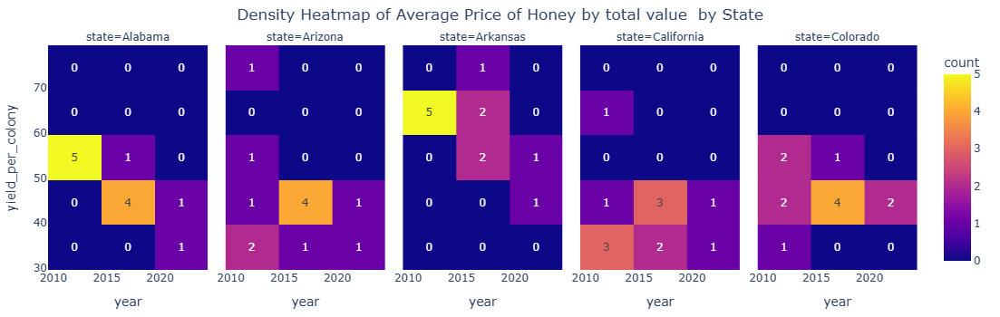

In [47]:
fig = px.density_heatmap(df[df['state'].isin(states)], x='year', y='yield_per_colony',
                         facet_col='state', text_auto=True,
                         width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nDensity Heatmap of Average Price of Honey by total value\n by State',
                  title_x=.5, title_y=.97)
fig.show()

### Contour Density Plot

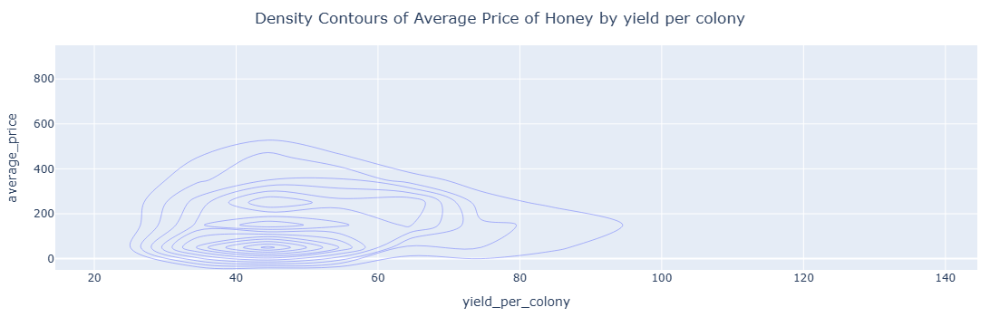

In [48]:
fig = px.density_contour(df, y='average_price', x='yield_per_colony',
                         width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\nDensity Contours of Average Price of Honey by yield per colony',
                  title_x=.5, title_y=.96)
fig.show()

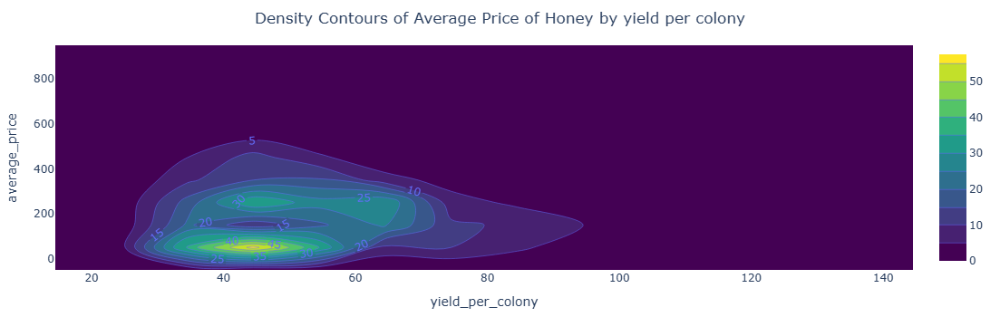

In [49]:
fig = px.density_contour(df,  y='average_price', x='yield_per_colony',
                         width=width, height=height)
fig.update_traces(contours_showlabels=True,contours_coloring='fill', colorscale='Viridis')#,
fig.update_layout(margin=margin_dict,
                  title='\nDensity Contours of Average Price of Honey by yield per colony',
                  title_x=.5, title_y=.96)
fig.show()

### 3D Analysis

### 3D Scatter Plot

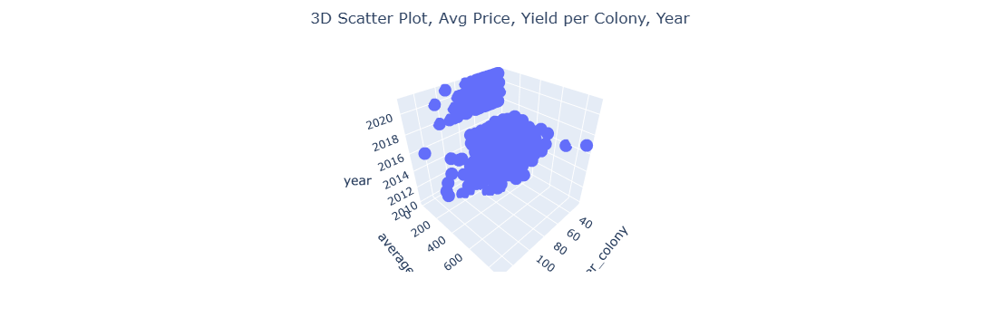

In [50]:
fig = px.scatter_3d(df, y='average_price', x='yield_per_colony', z='year',
                    width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\n3D Scatter Plot, Avg Price, Yield per Colony, Year',
                  title_x=.5, title_y=.96)
fig.show()

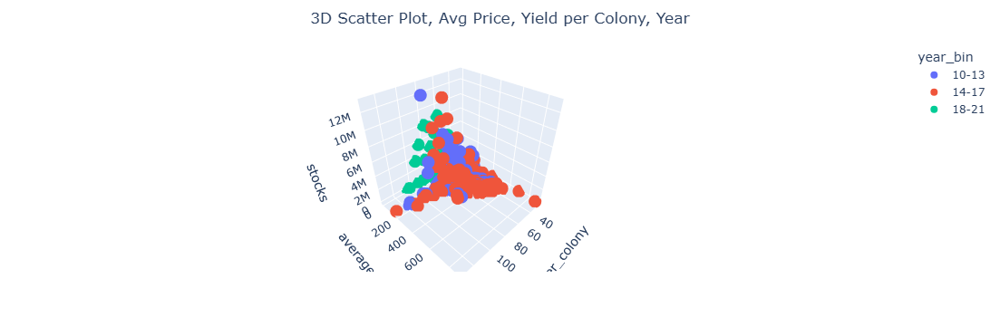

In [51]:
fig = px.scatter_3d(df, y='average_price', x='yield_per_colony', z='stocks',
                    color='year_bin',
                    width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\n3D Scatter Plot, Avg Price, Yield per Colony, Year',
                  title_x=.5, title_y=.96)
fig.show()

In [52]:
def avg_price_scale(x):
  if x[0] == '18-21':
    return x[1] * 100
  else:
    return x[1]

In [53]:
df['average_price_scaled'] = df[['year_bin','average_price']].apply(avg_price_scale, axis=1)

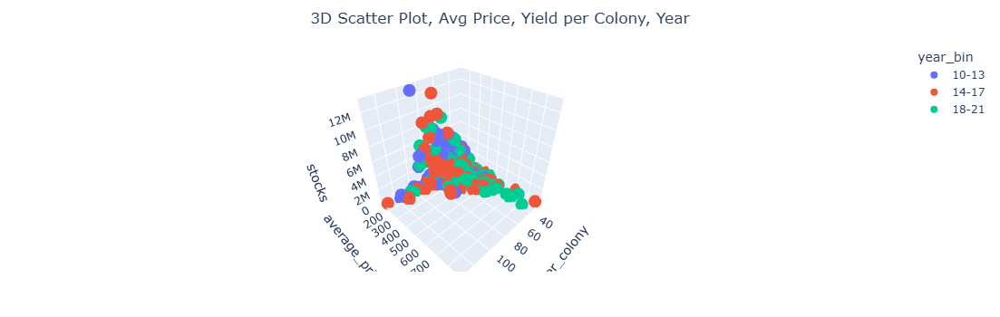

In [54]:
fig = px.scatter_3d(df, y='average_price_scaled', x='yield_per_colony', z='stocks',
                    color='year_bin',
                    width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\n3D Scatter Plot, Avg Price, Yield per Colony, Year',
                  title_x=.5, title_y=.96)
fig.show()

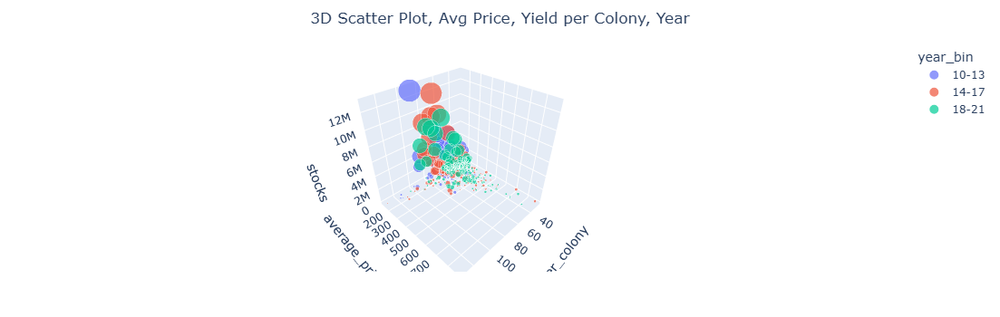

In [55]:
fig = px.scatter_3d(df, y='average_price_scaled', x='yield_per_colony', z='stocks',
                    color='year_bin', size='productions', size_max=40,
                    width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\n3D Scatter Plot, Avg Price, Yield per Colony, Year',
                  title_x=.5, title_y=.96)
fig.show()

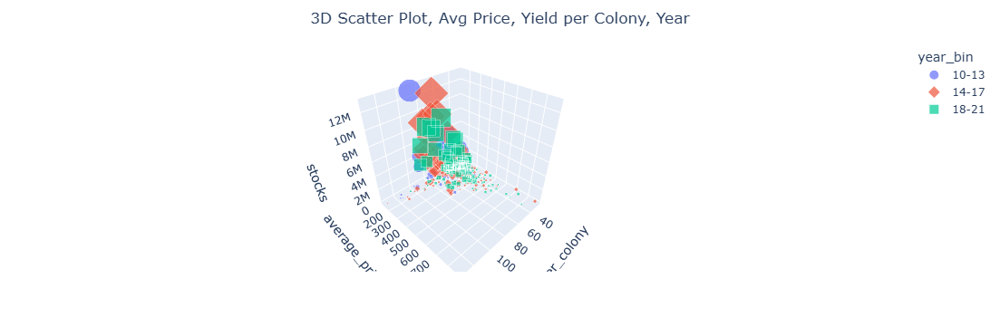

In [56]:
fig = px.scatter_3d(df, y='average_price_scaled', x='yield_per_colony', z='stocks',
                    symbol='year_bin', color='year_bin', size='productions', size_max=40,
                    width=width, height=height)
fig.update_layout(margin=margin_dict,
                  title='\n3D Scatter Plot, Avg Price, Yield per Colony, Year',
                  title_x=.5, title_y=.96)
fig.show()

### 3D Line Plot

In [57]:
df['state'].value_counts()

state
Alabama          12
Arizona          12
Arkansas         12
California       12
Colorado         12
Florida          12
Georgia          12
Hawaii           12
Idaho            12
Illinois         12
Indiana          12
Iowa             12
Kansas           12
Kentucky         12
Louisiana        12
Maine            12
Michigan         12
Minnesota        12
Mississippi      12
Missouri         12
Montana          12
Nebraska         12
NewJersey        12
NewYork          12
NorthCarolina    12
Utah             12
NorthDakota      12
Ohio             12
Oregon           12
Pennsylvania     12
SouthDakota      12
Tennessee        12
Texas            12
WestVirginia     12
Vermont          12
Virginia         12
Washington       12
Wyoming          12
Wisconsin        12
SouthCarolina     8
NewMexico         3
Name: count, dtype: int64

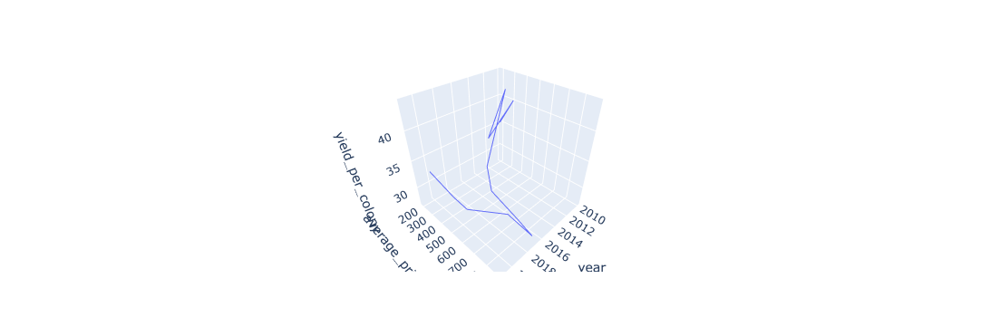

In [58]:
fig = px.line_3d (df[df['state'] == 'NewJersey'], y='average_price_scaled', z='yield_per_colony', x='year',
                    width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

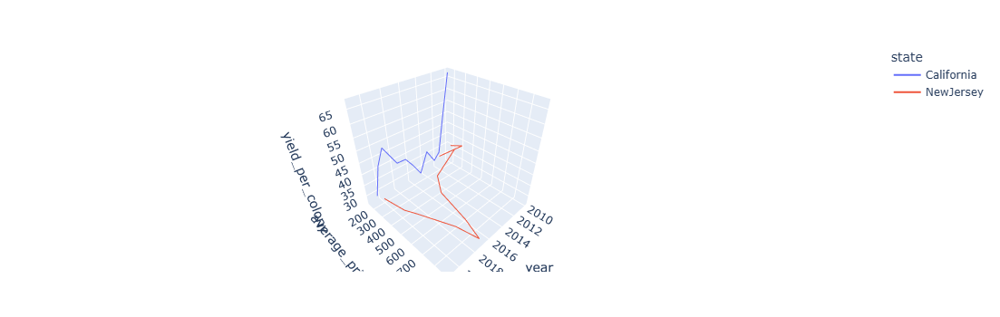

In [59]:
fig = px.line_3d (df[df['state'].isin(['NewJersey', 'California'])], y='average_price_scaled', z='yield_per_colony',
                  x='year', color='state',
                  width=width, height=height)
fig.update_layout(margin=margin_dict)
fig.show()

### Geo Analysis

### Scatter Geo

In [60]:
df1 = px.data.gapminder().query("year == 2007")
df1.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
35,Algeria,Africa,2007,72.301,33333216,6223.367465,DZA,12
47,Angola,Africa,2007,42.731,12420476,4797.231267,AGO,24
59,Argentina,Americas,2007,75.320,40301927,12779.379640,ARG,32


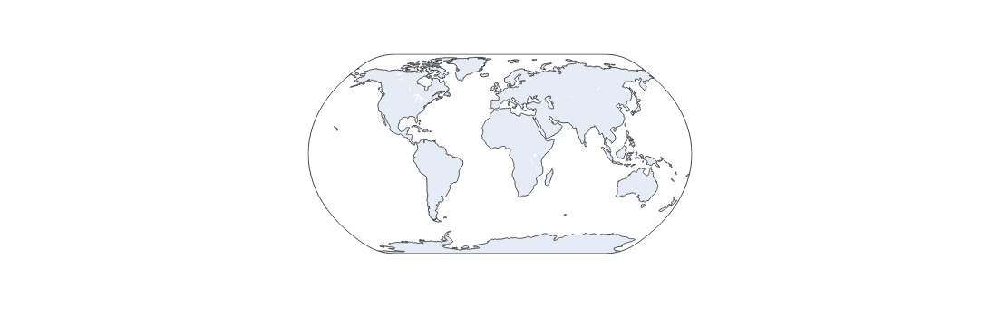

In [61]:
fig = px.scatter_geo(df, locations="state",
                    #  color="lifeExp", # which column to use to set the color of markers
                    #  hover_name="country", # column added to hover information
                    #  size="pop", # size of markers
                     projection="natural earth")
fig.show()

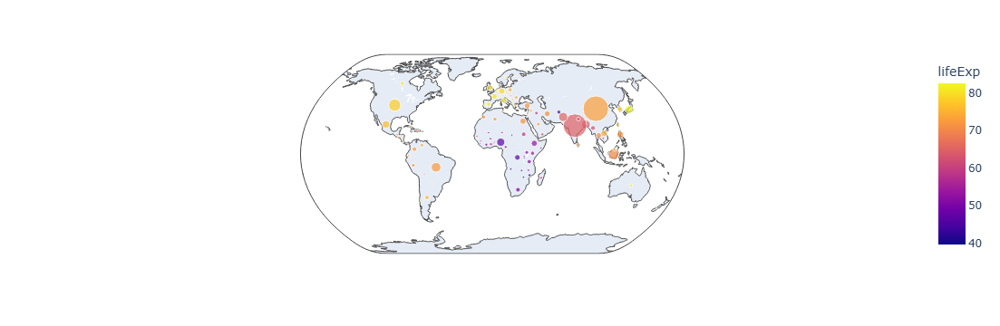

In [62]:

fig = px.scatter_geo(df1, locations="iso_alpha",
                     color="lifeExp", # which column to use to set the color of markers
                     hover_name="country", # column added to hover information
                     size="pop", # size of markers
                     projection="natural earth")
fig.show()

### Choropleth

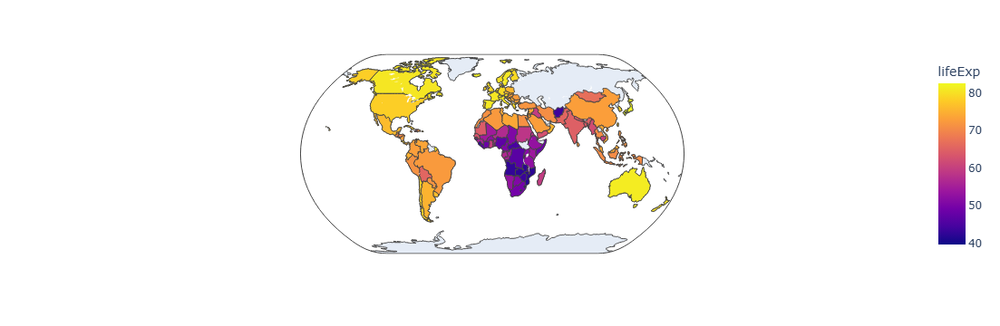

In [63]:
fig = px.choropleth(df1, locations="iso_alpha",
                     color="lifeExp", # which column to use to set the color of markers
                     hover_name="country", # column added to hover information
                     projection="natural earth")
fig.show()

### Interactive Pandas Plotting

In [64]:
pd.options.plotting.backend = 'plotly'

In [65]:
df.columns

Index(['state', 'colony_number', 'yield_per_colony', 'productions', 'stocks',
       'average_price', 'value_of_prod', 'year', 'year_bin',
       'yield_per_colony_bin', 'average_price_scaled'],
      dtype='object')

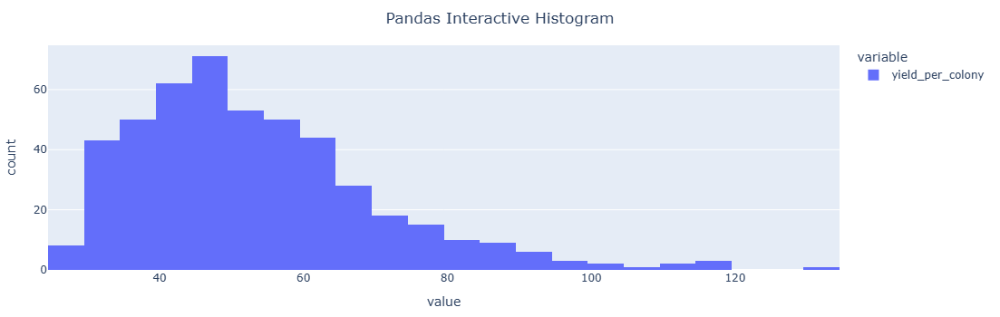

In [66]:
fig = df['yield_per_colony'].plot.hist(width=width, height=height)

fig.update_layout(margin=margin_dict,
                  title='\nPandas Interactive Histogram',
                  title_x=.5, title_y=.96)

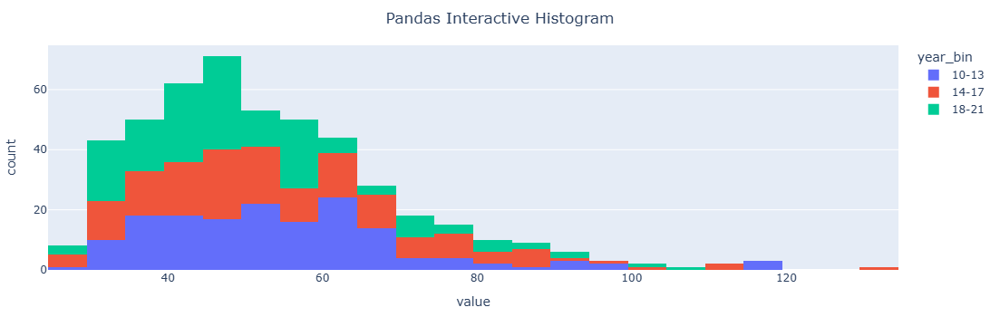

In [67]:
fig = df[['yield_per_colony', 'year_bin']].plot.hist(width=width, height=height, color='year_bin')

fig.update_layout(margin=margin_dict,
                  title='\nPandas Interactive Histogram',
                  title_x=.5, title_y=.96)

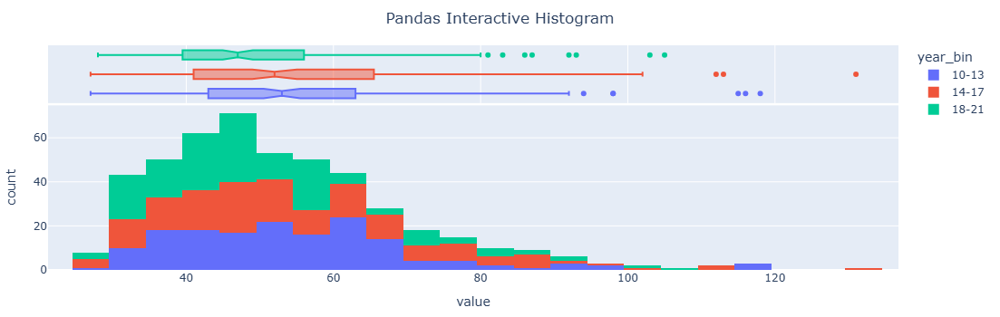

In [68]:
fig = df[['yield_per_colony', 'year_bin']].plot.hist(width=width, height=height, color='year_bin',
                                                     marginal='box')

fig.update_layout(margin=margin_dict,
                  title='\nPandas Interactive Histogram',
                  title_x=.5, title_y=.96)

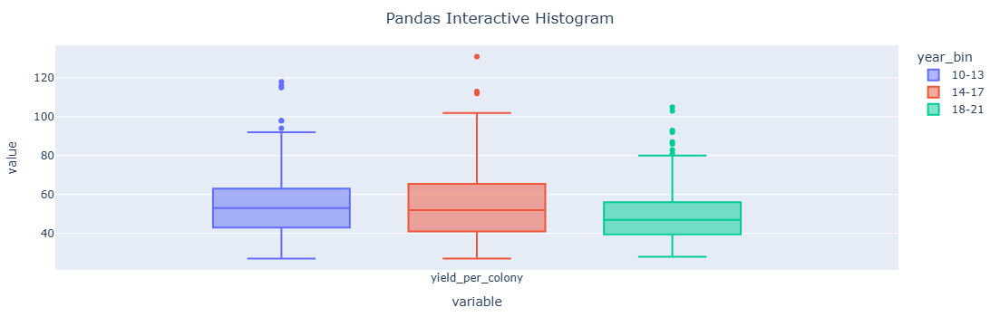

In [69]:
fig = df[['yield_per_colony', 'year_bin']].plot.box(width=width, height=height, color='year_bin')

fig.update_layout(margin=margin_dict,
                  title='\nPandas Interactive Histogram',
                  title_x=.5, title_y=.96)

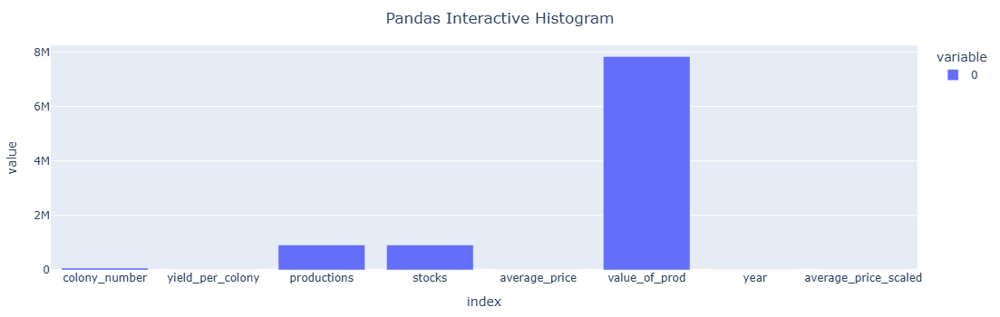

In [70]:
fig = df.mean(numeric_only=True).plot.bar(width=width, height=height)

fig.update_layout(margin=margin_dict,
                  title='\nPandas Interactive Histogram',
                  title_x=.5, title_y=.96)